Importing the necessary lib.   (Install the package using HyperSpy...Other installations show a runtime error)   
USING Python(conda env:base) Kernel

In [1]:
%matplotlib widget
import atomap.api as am

# Finding the position of the atomic coloums in the image.

### Using a dummy data -  simple cubic structure wit noise (using - "atomap.dummy_data")

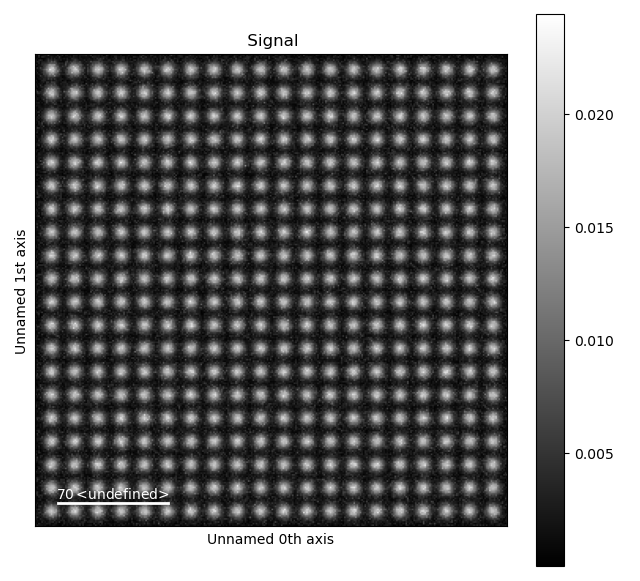

In [2]:
%matplotlib widget 
import atomap.api as am
import numpy as np
import atomap.dummy_data as dummy_data

s = dummy_data.get_simple_cubic_signal(image_noise=True)
s.plot()

Now when the curser moved around the image above one can obtain three parameters
x_coordinate, y_coordinate and the intensity

#### 1. Finding feature separation
Feature separation refers to the distance between neighboring atomic columns or features in an atomic-resolution STEM image. In Scanning Transmission Electron Microscopy (STEM), atoms are often imaged as distinct bright spots or columns due to their scattering properties.
>Feature separation is a parameter that provides information about the spatial arrangement of atoms within the material (In general it corresponds to the lattice parameter or the distance between adjacent lattice planes.)

<b>Steps involved 
>Image Preprocessing: Before identifying atomic columns, it's common to preprocess the STEM image to enhance contrast, reduce noise, and improve visibility of atomic features. Techniques such as smoothing, background subtraction, and filtering may be applied.

>Feature Detection: Once the image is preprocessed, feature detection algorithms are used to locate the atomic columns. These algorithms can include methods like thresholding, edge detection, or template matching. The goal is to identify areas in the image where atoms are located.

>Feature Localization: After detecting features, precise localization of atomic columns is essential. This might involve sub-pixel localization techniques to determine the center of each atomic column with high accuracy.

>Feature Separation: Finally, the distance between neighboring atomic columns (feature separation) needs to be determined. This information is crucial for subsequent steps like lattice parameter determination and atomic structure analysis.

Ref(Interpretations)DOI 10.1186/s40679-017-0042-5 and other common resources

Optimal pixel separation by using the Atomap function get_feature_separation(). <br> This function uses the peak finding algorithm for a range of pixel separations. The default separation range is 5 to 30. s_peaks is plotted below. <br> <i>  The left figure shows where the peak finding function has located a peak, the right figure shows the minimum feature separation in pixels on the x-axis.<b><i> Click the image then Ctrl key + left-right arrow keys to navigate through the different minimum feature separation, and see how it affects the result of the peak finding in the left figure.


In [3]:
s_peaks = am.get_feature_separation(s, separation_range=(2, 20), show_progressbar=False)
s_peaks.plot()

The range of pixel separations is 5 to 20. <b> The red dots are the atomic positions represented as peaks.
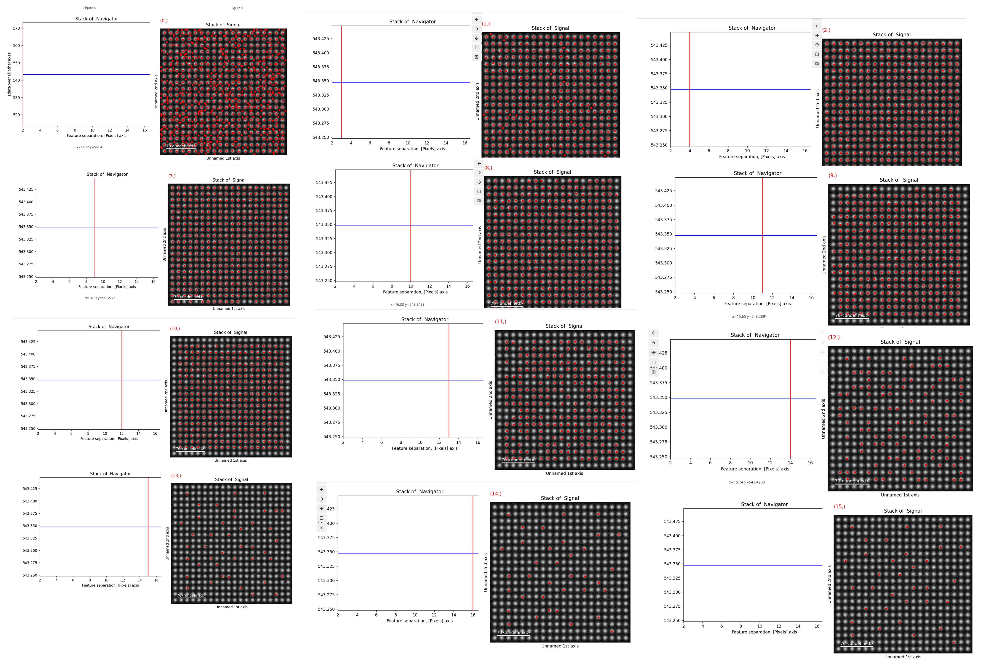

With a pixel separation of 2, too many atoms are found. <br><br>
With a pixel separation of 7, all atoms are identified. (Often, the program will have difficulties with finding the atoms in the rows at the boundary of the image. This does not matter, the important thing is that all atoms in the central part of the image are found.) <br><br>
12 is a too large pixel separation, as not all atoms in the interior of the image are found. This will create issues when the zone axes are constructed and atom planes are found (later in this)

In [4]:
print (s_peaks)

<Signal2D, title: Stack of , dimensions: (18|300, 300)>


In [5]:
s_peaks = am.get_feature_separation(s, separation_range=(2, 20), show_progressbar=True)
s_peaks.plot()

  0%|          | 0/18 [00:00<?, ?it/s]

[########################################] | 100% Completed | 103.49 ms


### 2. Generate the initial positions for the atomic columns and initialize a Sublattice

Generating the initial atomic positions using "get_atom_positions()" takes the atomic resolution image signal "s" and the optimal feature separation. The function also allows for PCA, relative threshold, background subtraction, and normalization of intensity.
<br><br> PCA stands for Principal Component Analysis. It's a statistical technique used to simplify data by reducing its dimensionality while preserving most of its original variability.
<br><br> "atom_positions" is a list of x and y coordinates of initial atom positions. If there are any missing or extra atoms "add_atoms_with_gui()" can be used. <br>
This list will be used to initialize a Sublattice object, which will contain all the information about the atoms. In this, all atoms belong to the same sublattice, so only one Sublattice object is needed. <br> The Sublattice object takes a list of atom positions, and a 2D NumPy array representing the image.

In [24]:
atom_positions = am.get_atom_positions(s, separation=8)
sublattice = am.Sublattice(atom_positions, image=s.data)
sublattice

<Sublattice,  (atoms:400,planes:0)>

In [25]:
atom_positions = am.get_atom_positions(s, separation=8)
sublattice = am.Sublattice(atom_positions, image=s.data)
print (sublattice)

<Sublattice,  (atoms:400,planes:0)>


In [26]:
print (atom_positions)

[[172 113]
 [ 54  69]
 [261 231]
 [ 98  69]
 [ 98 157]
 [128  84]
 [187 275]
 [128 274]
 [  9  10]
 [158 289]
 [ 25 171]
 [157 217]
 [232  25]
 [ 54 231]
 [231 276]
 [217 291]
 [290 142]
 [114  25]
 [217 260]
 [ 40 128]
 [201  54]
 [186 216]
 [246 172]
 [230 143]
 [ 54  40]
 [231 187]
 [143 113]
 [202  25]
 [247 261]
 [ 24  40]
 [231  84]
 [ 84 173]
 [202 275]
 [ 98 126]
 [275  68]
 [217  69]
 [ 53 260]
 [217  55]
 [246 202]
 [230  98]
 [216  84]
 [187  40]
 [ 99 173]
 [187 261]
 [ 25 290]
 [246 231]
 [142 187]
 [216 187]
 [260 202]
 [114 290]
 [ 39  85]
 [158  99]
 [ 54 246]
 [ 39 202]
 [142  54]
 [ 85  39]
 [245 113]
 [143 172]
 [173 246]
 [ 98 113]
 [172 201]
 [291 158]
 [246 143]
 [275 187]
 [170 291]
 [ 84 231]
 [217   9]
 [201 216]
 [261 144]
 [157  41]
 [246 276]
 [276 201]
 [261 217]
 [128  69]
 [ 25 187]
 [ 25  70]
 [246 290]
 [ 39 291]
 [217 129]
 [158  69]
 [260  84]
 [157 231]
 [ 53  10]
 [142  25]
 [ 55 172]
 [ 98 289]
 [261  26]
 [114 216]
 [ 11 216]
 [ 39 260]
 [ 85 217]

In [9]:
atom_positions.plot()

AttributeError: 'numpy.ndarray' object has no attribute 'plot'

As it is a 2D array "plot()" function will not work. <br>
Insted using "pyplot as plt" on can obtain the plot. 
<br> <i> (bounary are not fitted properly. I hope it is not a problem.) 

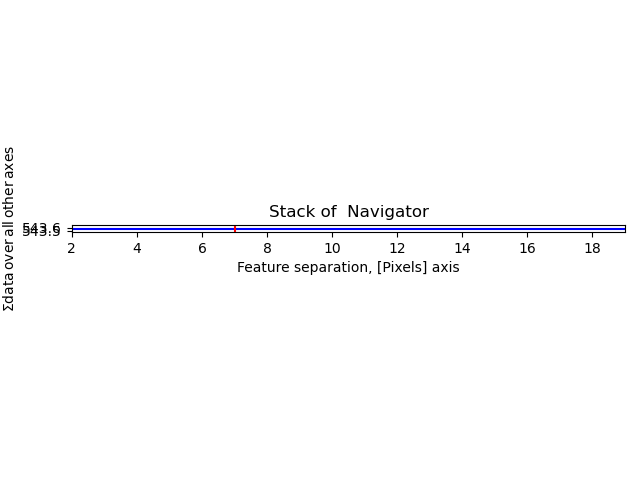

In [28]:
import matplotlib.pyplot as plt
plt.imshow(atom_positions, interpolation='none')
plt.show()

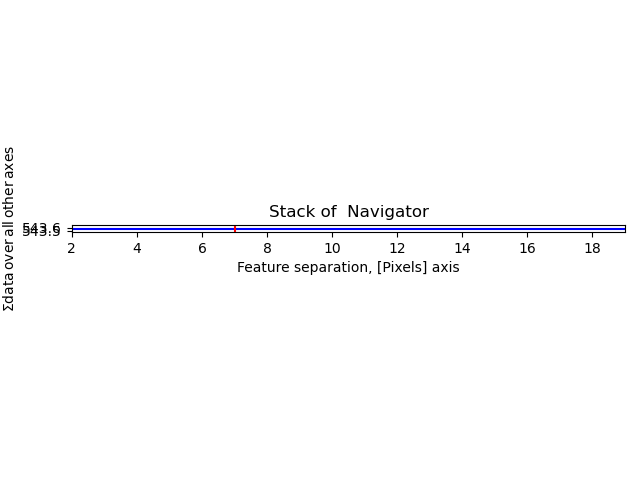

In [29]:
plt.imshow(atom_positions, interpolation='nearest')
plt.show()

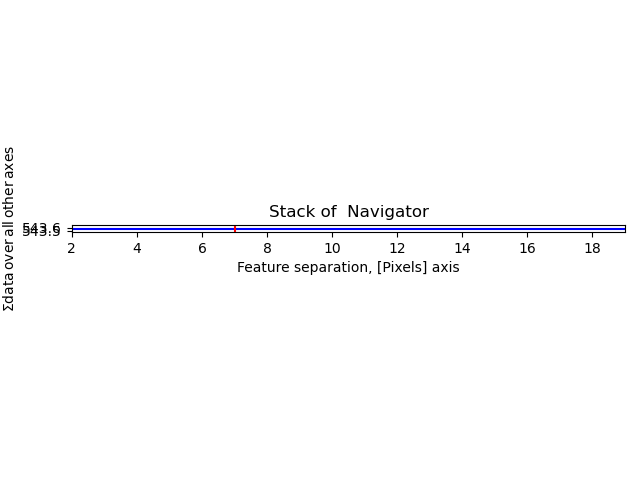

In [30]:
plt.imshow(atom_positions, interpolation='gaussian')
plt.show()

From the above two plots it can be seen that the interpolation has no effect. (it is common in some kind of data sets). 

### 3. Refine the position of the atomic columns
Atomap uses centre of mass "refine_atom_positions_using_center_of_mass()" first, and then 2D-Gaussians "refine_atom_positions_using_2d_gaussian()" to refine the positions (and shape) of the atomic columns. <br>
> The center of mass of an object is a point that represents the average position of all the mass in the object. In the context of STEM images, the intensity distribution around an atomic column can be approximated as a two-dimensional mass distribution.

Atomap estimates the position of atomic columns using the CoM method. This involves calculating the weighted average of the coordinates of all the pixels within each detected feature. 
>A 2D-Gaussian function is a mathematical model that describes the intensity distribution around a point source in two dimensions. It is characterized by parameters such as amplitude, center coordinates, and standard deviations along the x and y directions.

After obtaining initial estimates using CoM, Atomap further refines the positions and shapes of atomic columns by fitting 2D-Gaussian functions to the intensity distribution around each atomic column. This fitting process aims to find the parameters of the Gaussian function that best describe the observed intensity profile. <br> Fitting 2D-Gaussians allows for a more detailed characterization of the intensity distribution, capturing asymmetries and irregularities that the CoM method might overlook.

<i>Before the refinement, the nearest neighbours of each atomic column must be found. This is needed to for Atomap to know boundary values for the position refinements, and is set using "find_nearest_neighbors()"

In [31]:
sublattice.find_nearest_neighbors()
sublattice.refine_atom_positions_using_center_of_mass()
sublattice.refine_atom_positions_using_2d_gaussian()
sublattice.get_position_history().plot()

Center of mass:   0%|          | 0/400 [00:00<?, ?it/s]

Gaussian fitting:   0%|          | 0/400 [00:00<?, ?it/s]

The positions after the first and second refinement, in this case, the centre of mass and 2D-Gaussian respectively. <br>
The three positions are shown. There is very small noticeable difference difference in the atomic positions (red dots). The final image look to have a better fit i.e. at stack element axis = 2 
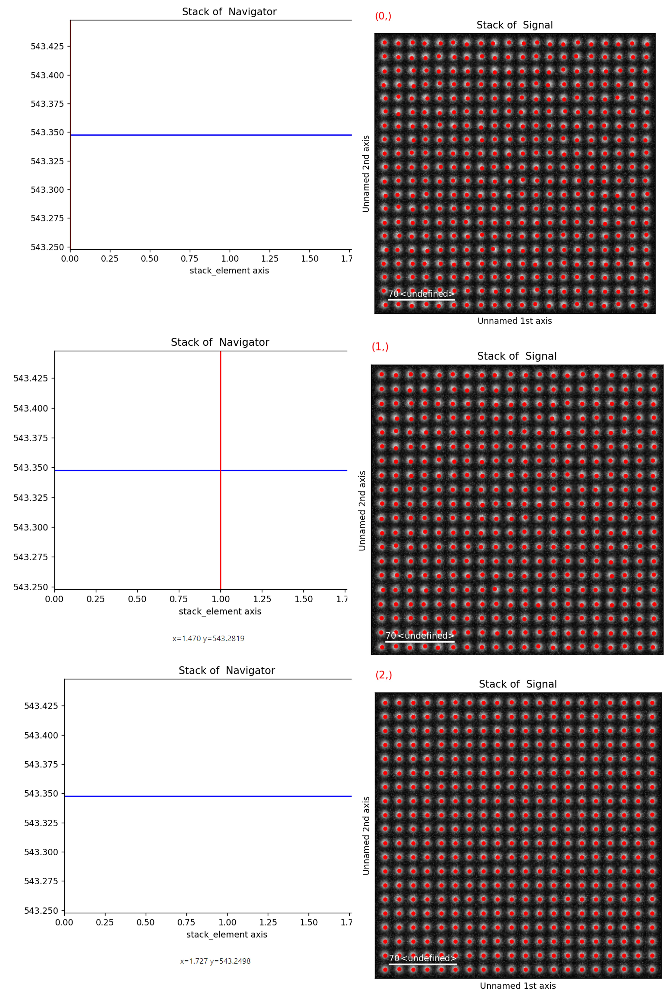

Atom positions have clearly been improved by the refinement. The quality of the fit is seen more clearly when we zoom in on the atoms.

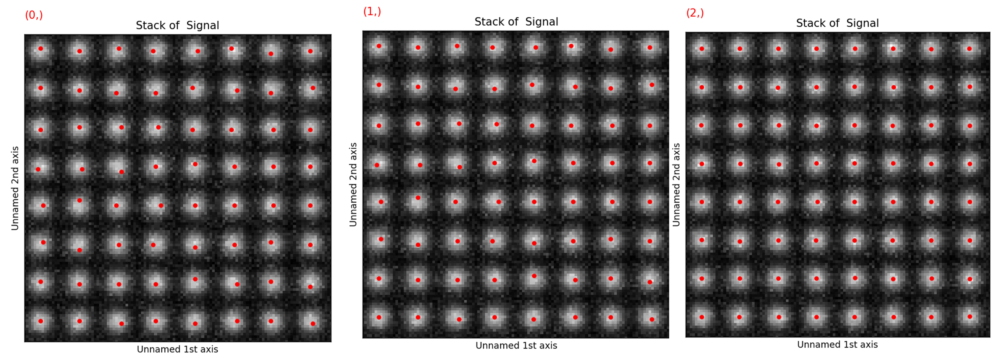

Information on the atoms in a sublattice can always be accessed through "sublattice.atom_list", which contains all the atom positions. Each atom position is represented as the "Atom_Position" class.

In [32]:
atom_list = sublattice.atom_list
atom_list[0]

<Atom_Position,  (x:172.0,y:113.1,sx:2.5,sy:2.5,r:0.4,e:1.0)>

In [33]:
from atomap.atom_position import Atom_Position
atom_position = Atom_Position(11, 8)
print (atom_position)

<Atom_Position,  (x:11,y:8,sx:1.0,sy:1.0,r:0.0,e:1.0)>


The above is just an reference form the documentation. <i><b>Need some clarification

<br> x (float) – ; y (float) – ; sigma_x (float, optional) – ; sigma_y (float, optional) – ; rotation (float, optional) – In radians. The rotation of the axes of the 2D-Gaussian relative to the image axes. In other words: the rotation of the sigma_x relative to the horizontal axis (x-axis). This is different from the rotation_ellipticity, which is the rotation of the largest sigma in relation to the horizontal axis. For the rotation of the ellipticity, see rotation_ellipticity.  ;  amplitude (float, optional) – Amplitude of Gaussian. Stored as amplitude_gaussian attribute. 

In [34]:
print (sublattice.atom_list)

[<Atom_Position,  (x:172.0,y:113.1,sx:2.5,sy:2.5,r:0.4,e:1.0)>, <Atom_Position,  (x:54.2,y:68.9,sx:2.5,sy:2.3,r:2.8,e:1.1)>, <Atom_Position,  (x:260.5,y:231.0,sx:2.4,sy:2.6,r:2.7,e:1.1)>, <Atom_Position,  (x:98.4,y:68.9,sx:2.4,sy:2.5,r:0.5,e:1.0)>, <Atom_Position,  (x:98.3,y:157.3,sx:2.6,sy:2.5,r:0.5,e:1.0)>, <Atom_Position,  (x:127.9,y:83.7,sx:2.4,sy:2.4,r:2.8,e:1.0)>, <Atom_Position,  (x:186.9,y:275.2,sx:2.6,sy:2.5,r:0.0,e:1.0)>, <Atom_Position,  (x:127.8,y:275.2,sx:2.6,sy:2.5,r:0.4,e:1.1)>, <Atom_Position,  (x:10.1,y:10.0,sx:2.7,sy:2.7,r:2.3,e:1.0)>, <Atom_Position,  (x:157.4,y:289.9,sx:2.4,sy:2.4,r:0.5,e:1.0)>, <Atom_Position,  (x:24.7,y:172.1,sx:2.7,sy:2.5,r:2.6,e:1.1)>, <Atom_Position,  (x:157.4,y:216.3,sx:2.6,sy:2.5,r:2.9,e:1.0)>, <Atom_Position,  (x:231.1,y:24.7,sx:2.4,sy:2.5,r:2.7,e:1.1)>, <Atom_Position,  (x:54.1,y:231.1,sx:2.4,sy:2.5,r:2.8,e:1.0)>, <Atom_Position,  (x:231.1,y:275.3,sx:2.5,sy:2.4,r:0.1,e:1.0)>, <Atom_Position,  (x:216.3,y:290.0,sx:2.7,sy:2.6,r:0.3,e:1.0)>, <A

### 4. Construct zone axes

Constructing zone axes in Atomap is essential for understanding the crystallographic orientation and symmetry of the material being analyzed in atomic resolution STEM images. 
>Zone axes represent specific directions in reciprocal space that correspond to the arrangement of atoms in the crystal lattice. They are defined by the Miller indices of the lattice planes perpendicular to the direction.

By constructing zone axes, Atomap helps identify the orientation of the crystal lattice within the material. This information is crucial for understanding the crystallographic properties, such as crystal structure, symmetry, and orientation relationships between different grains or regions.<br>
tomap uses nearest neighbor statistics in real space to find translation symmetry within the Sublattice. Constructing zone axes allows Atomap to identify and characterize the periodicity and symmetry of the atomic arrangement. This information is valuable for identifying crystallographic defects, analyzing grain boundaries, and understanding the overall structura of the material.

Atomap can find atom planes and zone axes in a 'Sublattice'. The program uses nearest neighbour statistics in real space, and finds the translation symmetry. This is done using the "construct_zone_axes()" method.<br>

Atom planes for the zone axes in the sublattice can easily be plotted. The atom planes are represented as "Atom_Plane" class objects, which contains all the atoms in one plane, and the relation between these atoms. <br>

<i><b> This is further discussed in "Analysing atom lattices".

In [35]:
sublattice.construct_zone_axes()
sublattice

<Sublattice,  (atoms:400,planes:4)>

In [36]:
sublattice.plot_planes()

Diifferent zone vectors
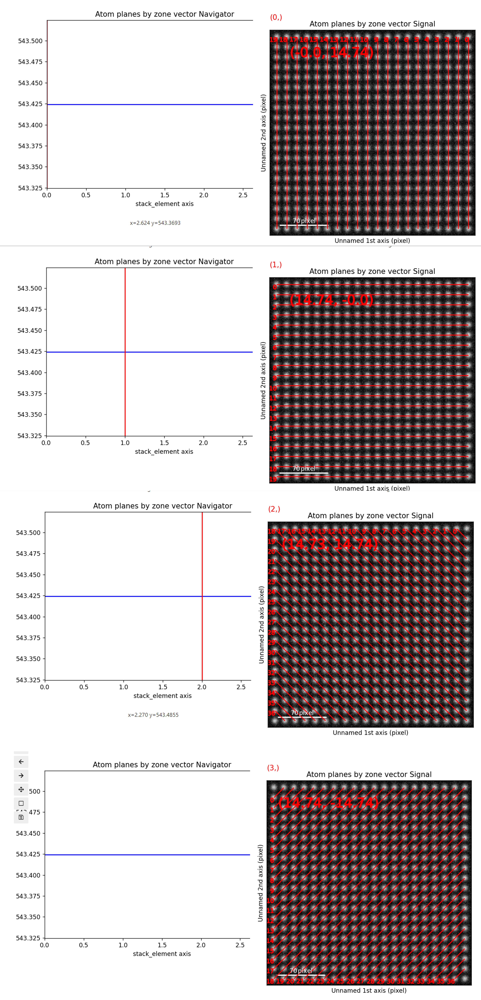

To get more atomic planes, increase the "nearest_neighbor" parameter from the default 15. (For this dataset there is no differece)

In [37]:
sublattice_cubic = am.dummy_data.get_simple_cubic_sublattice()
sublattice_cubic.construct_zone_axes(nearest_neighbors=25)
sublattice_cubic


<Sublattice,  (atoms:400,planes:8)>

In [38]:
sublattice.plot_planes()

### Doing the above for more than one sublattice  (dummy data set)

STEM images will have more than one sublattice. We will now find the atom positions in an image containing two sublattices, where the atomic columns in one of the sublattices are more intense than in the other. 

Center of mass:   0%|          | 0/104 [00:00<?, ?it/s]

Gaussian fitting:   0%|          | 0/104 [00:00<?, ?it/s]

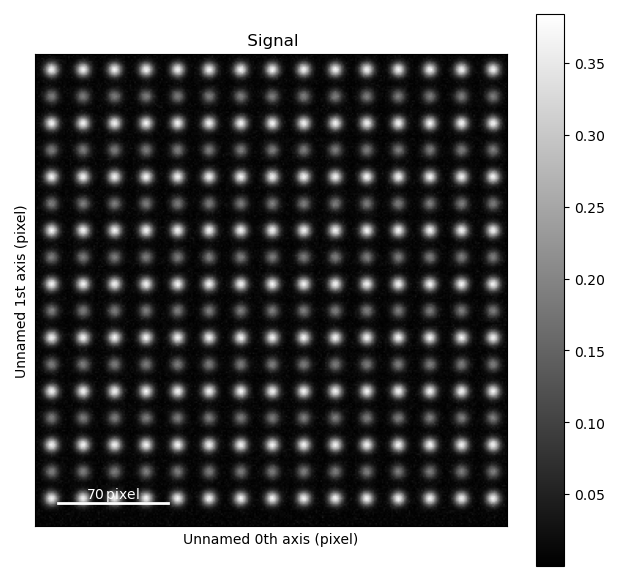

In [40]:
s = dummy_data.get_two_sublattice_signal()
A_positions = am.get_atom_positions(s, separation=15)
sublattice_A = am.Sublattice(A_positions, image=s.data, color='r')
sublattice_A.find_nearest_neighbors()
sublattice_A.refine_atom_positions_using_center_of_mass()
sublattice_A.refine_atom_positions_using_2d_gaussian()
sublattice_A.construct_zone_axes()
sublattice_A.plot()
sublattice_A.plot_planes()

Atomic columns belonging to the second, less intense sublattice (“B”) are between the “A” atoms in the most intense sublattice. Knowing this, the trick to find the initial positions for the “B”-columns is using "find_missing_atoms_from_zone_vector()".

In [41]:
zone_axis_001 = sublattice_A.zones_axis_average_distances[1]
B_positions = sublattice_A.find_missing_atoms_from_zone_vector(zone_axis_001)

In this case, the B-columns are exactly at the halfway point between the A-columns, however for other structures this might not work. If that is the case, use the vector_fraction parameter: "sublattice_A.find_missing_atoms_from_zone_vector(zone_axis_001, vector_fraction=0.7)".

To enable robust fitting of the less intense B-positions, the intensity from the A-positions are “subtracted” from the image. This “subtracted”-image is then used to refine the B-positions.

In [42]:
from atomap.tools import remove_atoms_from_image_using_2d_gaussian
image_without_A = remove_atoms_from_image_using_2d_gaussian(sublattice_A.image, sublattice_A)

Subtracting atoms:   0%|          | 0/104 [00:00<?, ?it/s]

In [43]:
sublattice_B = am.Sublattice(B_positions, image_without_A, color='blue')
sublattice_B.construct_zone_axes()
sublattice_B.refine_atom_positions_using_center_of_mass()
sublattice_B.refine_atom_positions_using_2d_gaussian()

Image data has negative values, with the lowest being -0.0003137078682051708. This is not supported, and can lead to bad fitting results. To fix the negative values, by increasing all pixel values by -0.0003137078682051708, use the fix_negative_values=True parameter


Center of mass:   0%|          | 0/91 [00:00<?, ?it/s]

Gaussian fitting:   0%|          | 0/91 [00:00<?, ?it/s]

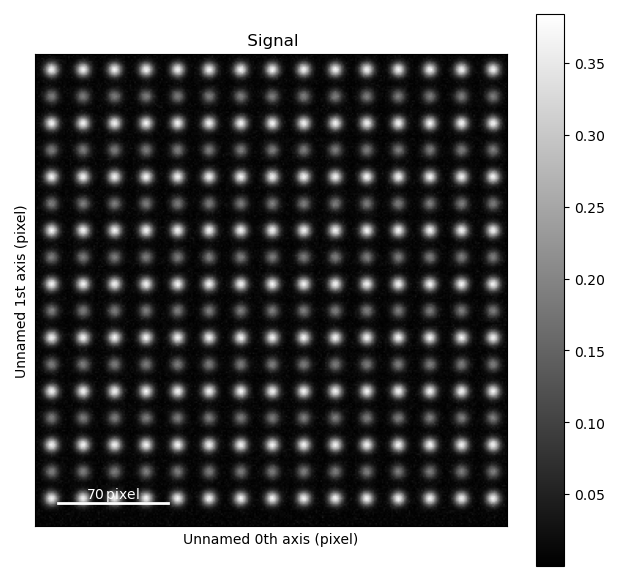

In [44]:
atom_lattice = am.Atom_Lattice(image=s.data, name='test', sublattice_list=[sublattice_A, sublattice_B])
atom_lattice.plot()

Saving the lattice as HDF5 image. (<i>The Hierarchical Data Format version 5 (HDF5), is an open source file format that supports large, complex, heterogeneous data. )

In [45]:
sublattice_A = atom_lattice.sublattice_list[0]

In [46]:
atom_lattice.save("atom_lattice.hdf5", overwrite=True)


In [47]:
atom_lattice2 = am.load_atom_lattice_from_hdf5("atom_lattice.hdf5")

Image data has negative values, with the lowest being -0.0003137078682051708. This is not supported, and can lead to bad fitting results. To fix the negative values, by increasing all pixel values by -0.0003137078682051708, use the fix_negative_values=True parameter


In [48]:
import atomap.api as am
sublattice = am.dummy_data.get_simple_cubic_sublattice()
atom_lattice = am.Atom_Lattice(image=sublattice.image, sublattice_list=[sublattice])
atom_lattice.save("simple_cubic_atom_lattice.hdf5", overwrite=True)

# Analysing atom lattices
After finding and refining the atom lattices as shown in Finding the atom lattice, the atomic structure can be analyzed by the following methods-
Ellipticity of the atomic columns ; 
Monolayer separation ;
Angle between monolayers ;
Integration of atomic columns ;
Making line profiles ;
Plotting a pair distribution function ;

Using a dummy image containing two sublattices. Different structural distortions have been introduced in the image, and this tutorial will study these distortions. The plots that are made are simple plots that clearly shows the structural changes in the sublattices.  
<i> refer plotting section in full documentation

Center of mass:   0%|          | 0/496 [00:00<?, ?it/s]

Gaussian fitting:   0%|          | 0/496 [00:00<?, ?it/s]

Subtracting atoms:   0%|          | 0/496 [00:00<?, ?it/s]

Center of mass:   0%|          | 0/465 [00:00<?, ?it/s]

Gaussian fitting:   0%|          | 0/465 [00:00<?, ?it/s]

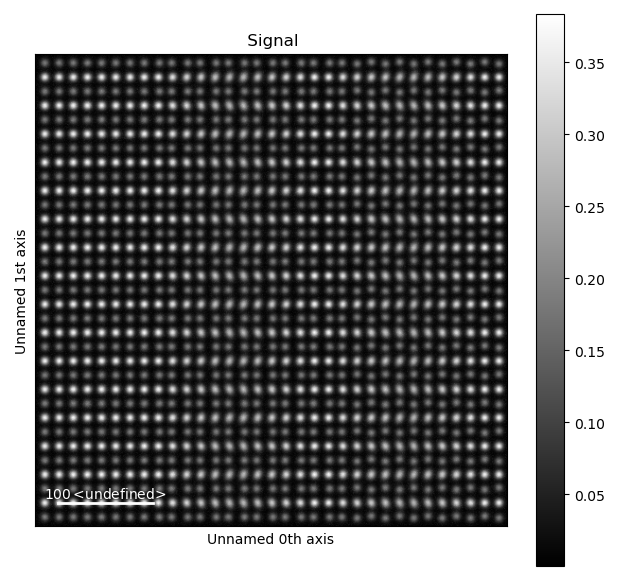

C:\Users\user\HyperSpy-bundle\Lib\site-packages\hyperspy\drawing\utils.py:168: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**kwargs)


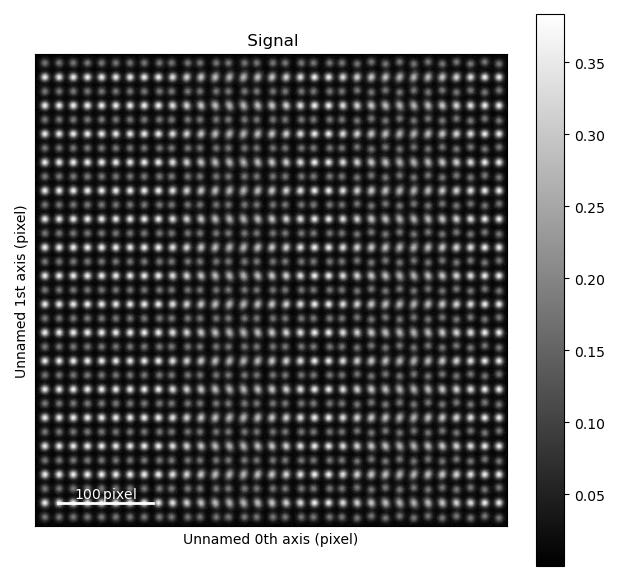

In [49]:
s = am.dummy_data.get_fantasite()
A_positions = am.get_atom_positions(s, separation=12, pca=True)
sublattice_A = am.Sublattice(A_positions, image=s.data, color='r', name='A')
sublattice_A.find_nearest_neighbors()
sublattice_A.refine_atom_positions_using_center_of_mass()
sublattice_A.refine_atom_positions_using_2d_gaussian()
sublattice_A.construct_zone_axes()

direction_001 = sublattice_A.zones_axis_average_distances[1]
B_positions = sublattice_A.find_missing_atoms_from_zone_vector(direction_001)
image_without_A = remove_atoms_from_image_using_2d_gaussian(sublattice_A.image, sublattice_A)

sublattice_B = am.Sublattice(B_positions, image_without_A, color='blue', name='B')
sublattice_B.construct_zone_axes()
sublattice_B.refine_atom_positions_using_center_of_mass()
sublattice_B.refine_atom_positions_using_2d_gaussian()
atom_lattice = am.Atom_Lattice(image=s.data, name='fantasite', sublattice_list=[sublattice_A, sublattice_B])
atom_lattice.save("fantasite.hdf5", overwrite=True)
s.plot()
atom_lattice.plot()

### The Atom_Lattice object
"atomap.atom_lattice.Atom_Lattice" is an object containing the sublattices, and other types of information. The atom lattice contains two sublattices (red and blue dots in the image above). Atom positions, sigma, ellipticity and rotation for the atomic columns in a sublattice can be accessed via attributes in the sublattice object.

In [50]:
import atomap.api as am
atom_lattice = am.load_atom_lattice_from_hdf5("fantasite.hdf5")
print(atom_lattice)
print(atom_lattice.sublattice_list) 
image = atom_lattice.image

<Atom_Lattice, fantasite (sublattice(s): 2)>
[<Sublattice, A (atoms:496,planes:6)>, <Sublattice, B (atoms:465,planes:6)>]


In [51]:
sublattice_A = atom_lattice.sublattice_list[0]
x = sublattice_A.x_position
y = sublattice_A.y_position
sigma_x = sublattice_A.sigma_x
sigmal_y = sublattice_A.sigma_y
ellipticity = sublattice_A.ellipticity
rotation = sublattice_A.rotation_ellipticity

Properties of a single atomic column "atomap.atom_position.Atom_Position" can be accessed in "atomap.sublattice.Sublattice.atom_list". The "atomap.atom_position.Atom_Position" object contain information related to a specific atomic column.

The "atomap.atom_plane.Atom_Plane" objects contain the atomic columns belonging to the same specific plane. Atom plane objects are defined by the direction vector parallel to the atoms in the plane, for example (58.81, -41.99). These can be accessed by:

In [52]:
atom_position_list = sublattice_A.atom_list
atom_position = atom_position_list[0]
x = atom_position.pixel_x
y = atom_position.pixel_y
sigma_x = atom_position.sigma_x
sigma_y = atom_position.sigma_y

Atom planes for a specific direction can also be accessed

In [53]:
zone_axis0 = sublattice_A.zones_axis_average_distances[0]
atom_plane_list0 = sublattice_A.atom_planes_by_zone_vector[zone_axis0]

## Ellipticity
In the context of crystalline structures and materials science, ellipticity refers to the deviation of atomic columns from a perfect circular shape to an elliptical one. This deviation can indicate various types of structural distortions or anisotropies within the material. 
<br>Strain Mapping: Strain mapping involves measuring the deformation of a material relative to its original, undeformed state. It provides detailed information about the distribution and magnitude of strain within a material, which is crucial for understanding its mechanical properties and behavior under different conditions.
>Ellipticity can be used as a visual indicator of strain. When a material undergoes strain, the atomic positions shift, and this can lead to changes in the shape of atomic columns from circular to elliptical. By mapping ellipticity, one can infer regions of the material that are under different amounts or types of strain.

>Ellipticity can serve as a visual indicator of strain. When a material undergoes strain, the atomic positions shift, and this can lead to changes in the shape of atomic columns from circular to elliptical. By mapping ellipticity, one can infer regions of the material that are under different amounts or types of strain.

>A gradient in the ellipticity map, where ellipticity changes gradually across the material, can reveal the presence of strain gradients. These gradients are important in understanding how stress and strain are distributed within the material.



The ellipticity map shows the magnitude of the ellipticity. Values are interpolated, giving a continuous map. The sublattice B was generated without any ellipticity, and the image to the right is fairly flat, as expected. In sublattice A, a region with elliptical atomic columns is clearly visible. The ellipticity gradient is perfectly in line with how the dummy image of fantasite has been generated.

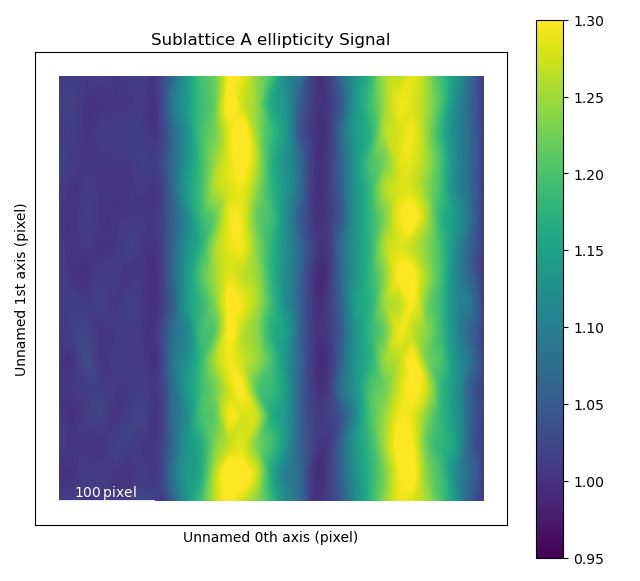

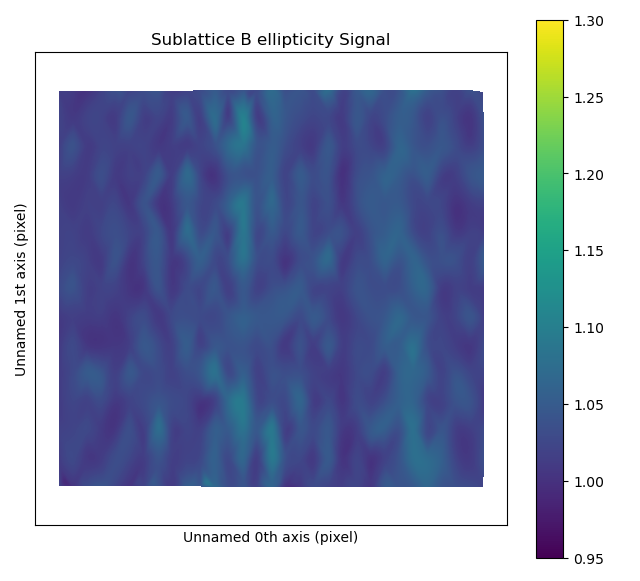

In [54]:
sublattice_A = atom_lattice.sublattice_list[0]
sublattice_B = atom_lattice.sublattice_list[1]
sublattice_A.plot_ellipticity_map(cmap='viridis', vmin=0.95, vmax=1.3)
sublattice_B.plot_ellipticity_map(cmap='viridis', vmin=0.95, vmax=1.3)

While the ellipticity map nicely visualizes the magnitude (and gradual change) of the ellipticity, it does not show the direction of the ellipticity. In vector (quiver) plots ("plot_ellipticity_vectors()") both the rotation and magnitude are visualized, through the length and angle of the arrows. There is one arrow for each atom position. 

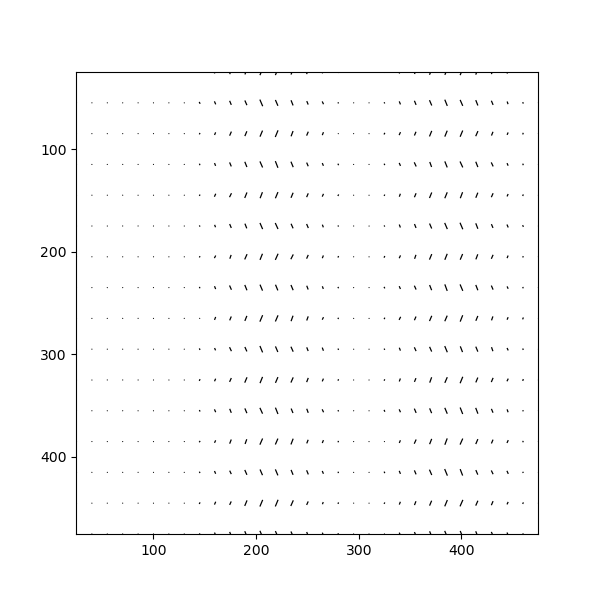

In [55]:
sublattice_A.plot_ellipticity_vectors()


### Distance between monolayers and Atom distance difference

Default is to find the monolayer separation for all the zone axes.

In [56]:
s_monolayer = sublattice_B.get_monolayer_distance_map()
s_monolayer.plot(cmap='viridis')

The B-sublattice of fantasite has two different domains of structural distortion.The monolayers in (0.0, -30.0) direction are alternatively closer and further apart. The corresponding distance difference will be the distance difference for atoms in the orthogonal planes (index 0, value (15.0, 0.0), shown below).

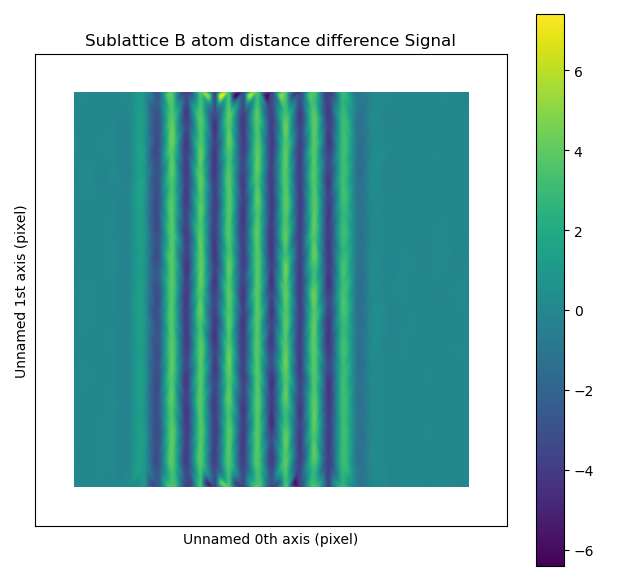

In [57]:
zone = sublattice_B.zones_axis_average_distances[0]
s_dd = sublattice_B.get_atom_distance_difference_map([zone])
s_dd.plot(cmap='viridis')
sublattice_B.plot_planes(image=atom_lattice.image)

The second structural domain is found in the vertical planes.

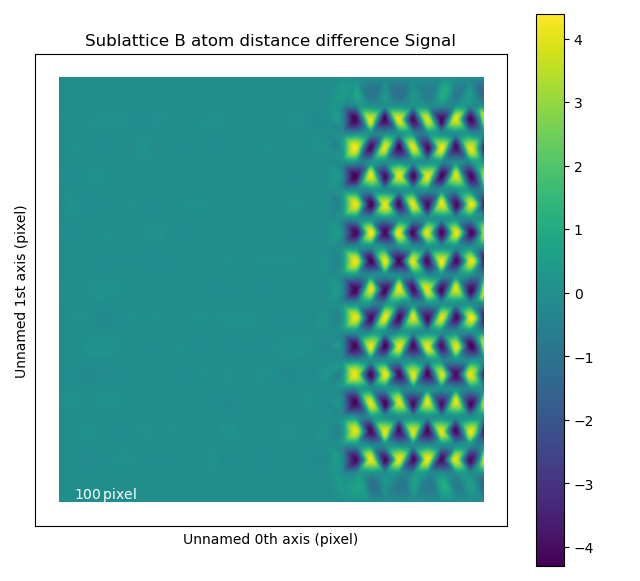

In [58]:
zone = sublattice_B.zones_axis_average_distances[1]
s_dd = sublattice_B.get_atom_distance_difference_map([zone], add_zero_value_sublattice=sublattice_A)
s_dd.plot(cmap='viridis')


## Angle between the atoms
The atomic columns start to “zigzag” in the rightmost part of the image. This is also clear with the naked eye (atomic columns marked with blue dots). 

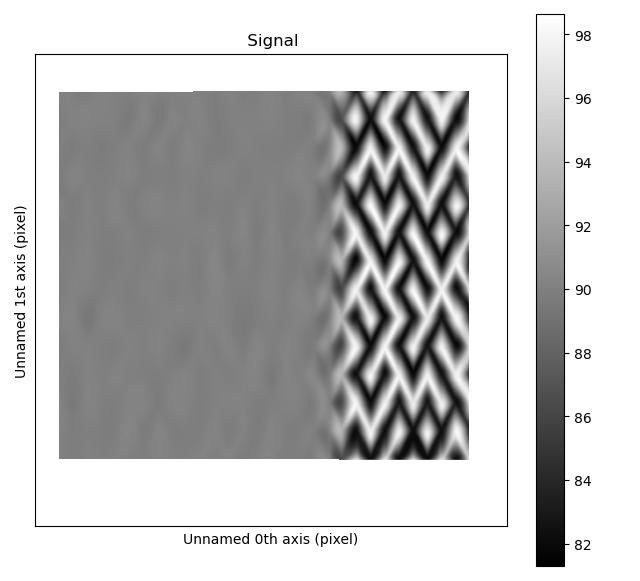

In [59]:
z1 = sublattice_B.zones_axis_average_distances[0]
z2 = sublattice_B.zones_axis_average_distances[1]
x, y, a = sublattice_B.get_atom_angles_from_zone_vector(z1, z2, degrees=True)
s_angle = sublattice_B.get_property_map(x, y, a)
s_angle.plot()

## Line profile

Line profiles are a technique used in imaging and data analysis to extract and visualize one-dimensional data from a higher-dimensional dataset. In can be done by integrating or averaging the values along a line or path within an imag.
>Improving Signal-to-Noise Ratio (SNR):By averaging the data points along a line, random noise can be reduced, resulting in a clearer signal. This is particularly useful in noisy datasets where individual data points might be obscured by noise.

>Dimensionality Reduction:Converting a two-dimensional image or dataset into a one-dimensional profile simplifies the analysis and visualization. It allows for easier comparison of specific features across different regions.

>Property Analysis: Line profiles can be used to analyze various properties, such as intensity, ellipticity, strain, or any other measurable attribute within the dataset. This can help identify trends, gradients, or anomalies along the specified line.

Select a Line:
Choose a line or path within the image along which you want to extract the profile. This line can be straight or curved, depending on the features you are interested in.

Integrate or Average Data:
For each point along the line, integrate or average the data values perpendicular to the line. This can involve summing the values or calculating the mean, depending on the specific analysis requirements.

Plot the Line Profile:
Generate a plot of the integrated or averaged values as a function of position along the line. This one-dimensional plot is the line profile.

In [60]:
zone = sublattice_A.zones_axis_average_distances[1]
plane = sublattice_A.atom_planes_by_zone_vector[zone][23]
s_elli_line = sublattice_A.get_ellipticity_line_profile(plane)

In the above example, "plane" is atom plane number 23 in the right figure. This the “last plane” from the left where the atomic columns in "sublattice_A" are circular. In plane 22, the columns become elliptical. This plane is therefore sent into the function "get_ellipticity_line_profile()", as the definition of where the interface (between two structural domains) is. The values for ellipticity are integrated and averaged in the same direction as the plane, and plotted

<b><i> NEED TO UNDERSTAND MORE

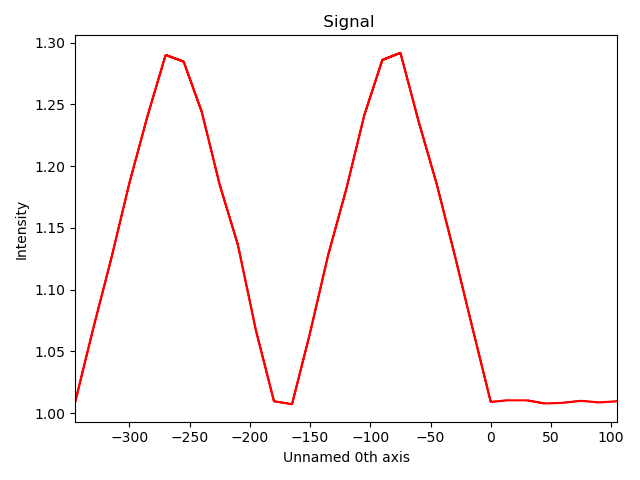

In [61]:
s_elli_line.plot()

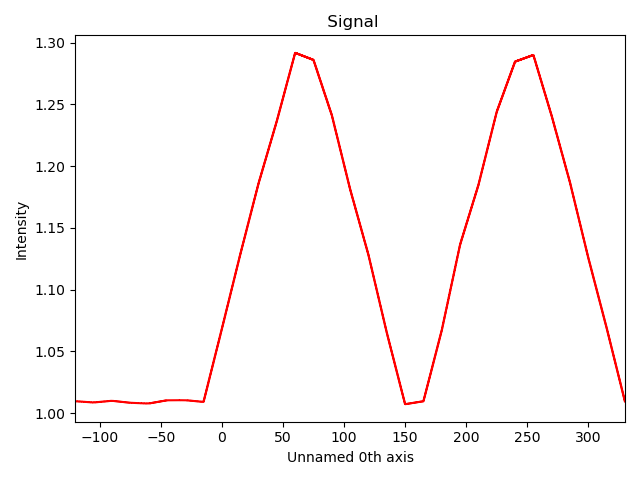

In [62]:
zone = sublattice_A.zones_axis_average_distances[1]
plane = sublattice_A.atom_planes_by_zone_vector[zone][22]
s_elli_line = sublattice_A.get_ellipticity_line_profile(plane)
s_elli_line.plot()

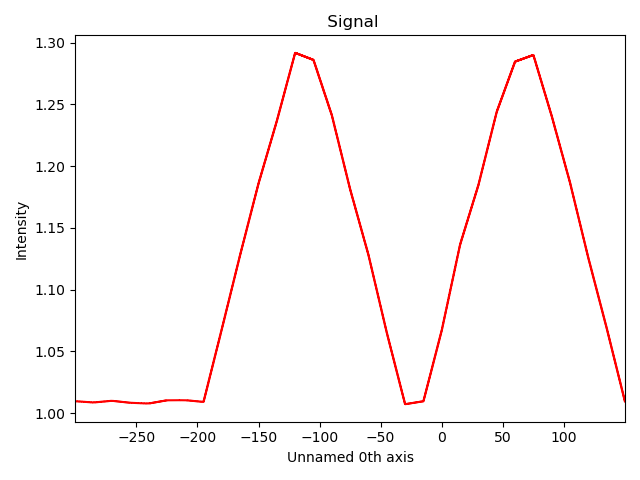

In [63]:
zone = sublattice_A.zones_axis_average_distances[1]
plane = sublattice_A.atom_planes_by_zone_vector[zone][10]
s_elli_line = sublattice_A.get_ellipticity_line_profile(plane)
s_elli_line.plot()

In [64]:
position = s_elli_line.metadata.line_profile_data.x_list
ellipticity = s_elli_line.metadata.line_profile_data.y_list
standard_deviation = s_elli_line.metadata.line_profile_data.std_list

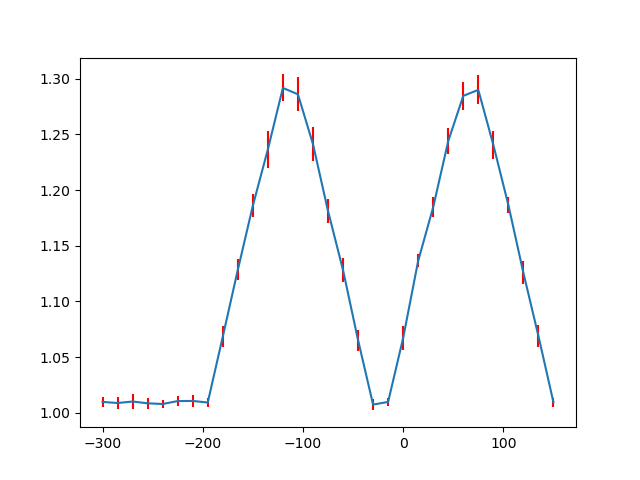

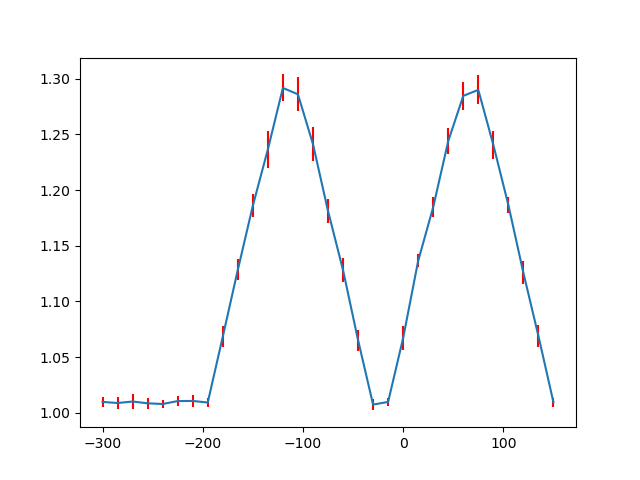

In [65]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
_ = ax.errorbar(position, ellipticity, yerr=standard_deviation, ecolor='red')
fig.show()

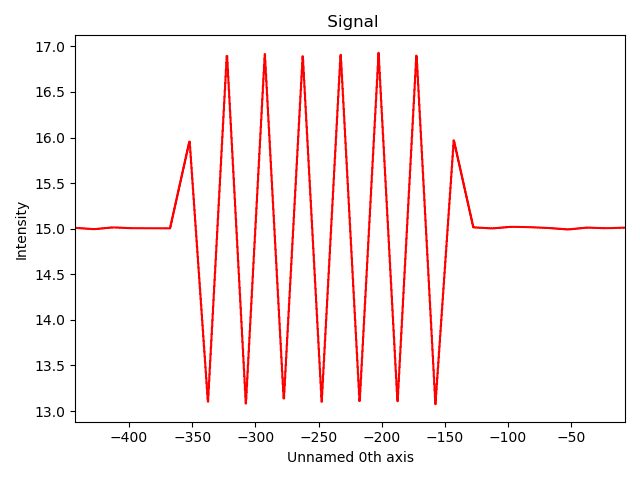

In [66]:
zone = sublattice_B.zones_axis_average_distances[1]
plane = sublattice_B.atom_planes_by_zone_vector[zone][0]
s_monolayer_line = sublattice_B.get_monolayer_distance_line_profile(zone, plane)
s_monolayer_line.plot()

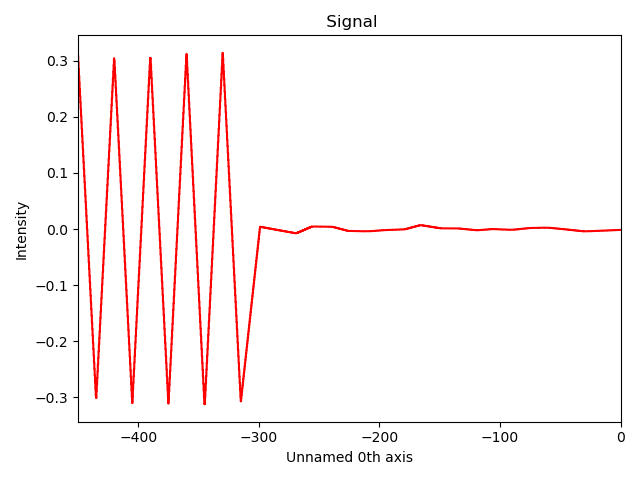

In [67]:
zone = sublattice_B.zones_axis_average_distances[1]
plane = sublattice_B.atom_planes_by_zone_vector[zone][-1]
s_dd_line = sublattice_B.get_atom_distance_difference_line_profile(zone, plane)
s_dd_line.plot()